In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import os
from glob2 import glob
import scipy 
import plotly.graph_objects as go
from scipy.spatial import distance_matrix

In [2]:
root =  "/media/nick/hdd02/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/pecfin_dynamics/point_cloud_data/"
folder = "segmentation_training_20240808"
df_path = os.path.join(root, "segmentation_training", folder, "data", "")
df_list = sorted(glob(df_path + "*well*"))


#### Load data and remove small masks

In [6]:
def calculate_path_distance(FDECAB, p0, p1):
    dx = p0[0] - p1[0]
    dy = p0[1] - p1[1]

    I = quad(numerical_integral, 0, 1, args=(FDECAB, p0, [dx, dy]))

    return I[1] - I[0]

def solve_for_f(C_fit, cp):
    # C0 = z0 - C1*x0 - C2*y0 - C3*x0*yz - C4*x0**2 - C5*Y0**2
    x0 = cp[0]
    y0 = cp[1]
    z0 = cp[2]
    C0 = z0 - C_fit[0] * x0 - C_fit[1] * y0 - C_fit[2] * x0 * y0 - C_fit[3] * x0 ** 2 - C_fit[4] * y0 ** 2
    C_out = [C0, C_fit[0], C_fit[1], C_fit[2], C_fit[3], C_fit[4]]
    return C_out

def predict_quadratic_surface(xy, DECAB, point):
    C_full = solve_for_f(DECAB, point)
    A = np.c_[np.ones(xy.shape[0]), xy, np.prod(xy, axis=1), xy**2]
    surf_pd = np.dot(A, C_full).ravel()
    xyz_out = np.concatenate((xy, np.reshape(surf_pd, (xy.shape[0], 1))), axis=1)
    return xyz_out, C_full
    
def numerical_integral(t, FDECAB, P0, V):
    F, D, E, C, A, B = FDECAB
    v0, v1 = V
    x0, y0, _ = P0
    integrand = np.sqrt(v0**2 + v1**2 + (D*v0 + 2*A*v0*(t*v0 + x0) + v1*(E + 2*C*t*v0 + 2*B*t*v1 + C*x0) + (C*v0 + 2*B*v1)*y0)**2)
    return integrand

def calculate_tangent_plane(C_full, point):
    F, D, E, C, A, B = C_full
    dfdx = 2 * A * point[0] + C * point[1] + D
    dfdy = 2 * B * point[1] + C * point[0] + E
    dfdz = -1
    plane_vec_norm = np.asarray([dfdx, dfdy, dfdz])
    plane_vec_norm = plane_vec_norm / np.sqrt(np.sum(plane_vec_norm ** 2))
    
    # calculate D
    D = -np.dot(plane_vec_norm, point)
    return plane_vec_norm, D

def make_quadratic_array(data):
    A = np.c_[np.ones(data.shape[0]), data[:,:2], np.prod(data[:,:2], axis=1), data[:,:2]**2]
    return A

def predict_z(A, C):
    Z = np.dot(A, C)
    return Z


def quadratic_z_loss(C, data):
    A = make_quadratic_array(data)
    Z = predict_z(A, C)
    residuals = data[:, 2] - Z
    return residuals

In [134]:
ind = -12
print(df_list[ind])
df_path = df_list[ind]
df = pd.read_csv(df_path)
df["label"] = df["label"] + 1
# size_thresh = 150
# df = df.loc[df["size"]>=size_thresh, :]

# print(df.shape)

fig = px.scatter_3d(df, x="X", y="Y", z="Z",  color="label",  opacity=1)
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

/media/nick/hdd02/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/pecfin_dynamics/point_cloud_data/segmentation_training/segmentation_training_20240808/data/20240712_02_well0051_time0000_tissue_labels.csv


### Calculate distance from each yolk point to fin
**To-do:** Find a way to filter out low and high outliers

In [135]:
# calculate distances
yolk_data0 = df.loc[df["label"]==2, ["X", "Y", "Z"]].to_numpy()
fin_data0 = df.loc[df["label"]==1, ["X", "Y", "Z"]].to_numpy()
dist_mat = distance_matrix(yolk_data0, fin_data0)
yolk_to_fin_dist = np.min(dist_mat, axis=1) # just using simple euclidean distance for now

# filter for nearby surface nuclei
dist_thresh = 75 # in um
dist_ft = yolk_to_fin_dist <= dist_thresh
yolk_data1 = yolk_data0[dist_ft]

fig = px.scatter_3d(df.loc[df["label"]==2], x="X", y="Y", z="Z",  color=yolk_to_fin_dist,  opacity=1)
fig.update_traces(marker_size = 4)
fig.update_scenes(zaxis_autorange="reversed")
scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()

In [136]:
# best-fit quadratic curve. Currently of form z = f(x,y). This will work so long as yolk is not vertical in z plane
test_y = np.arange(np.percentile(yolk_data1[:,1], 0.5), np.percentile(yolk_data1[:,1], 99.5), 1)
test_x = np.arange(np.percentile(yolk_data1[:,0], 0.5), np.percentile(yolk_data1[:,0], 99.5), 1)
XX, YY = np.meshgrid(test_x, test_y)
X = XX.ravel()
Y = YY.ravel()

def loss_fun(C, data=yolk_data1):
    loss =  quadratic_z_loss(C, data)
    return loss

c0 = np.asarray([-3, 0.01, 0.015, 0.001, 0.005, 0.01])
C_yolk = scipy.optimize.least_squares(loss_fun, c0)#, bounds=([-np.inf, 0, 0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf, np.inf, np.inf]))
# A = make_quadratic_array(yolk_data1)
# C_yolk,_,_,_ = scipy.linalg.lstsq(A, data[:,2])
A = make_quadratic_array(np.c_[X, Y])
# # evaluate it on a grid
Z = predict_z(A, C_yolk.x)

yolk_surf_xyz = np.c_[X, Y, Z]

fig = px.scatter_3d(df.loc[df["label"]==2], x="X", y="Y", z="Z", color=dist_ft, opacity=.75)
fig.add_trace(go.Surface(x=XX, y=YY, z=np.reshape(Z, XX.shape)))
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

### Fit 3D mesh to fin. Use this to obtain fin centerpoints

### Flag outiers based on nucleus size and nn distance metrics

In [219]:
import open3d as o3d

size_thresh = 100
std_thresh = .1

k_nn = 3
tree = KDTree(fin_data0)
nearest_dist, nearest_ind = tree.query(fin_data0, k=k_nn + 1)

nn_mean = np.mean(nearest_dist, axis=0)
nn_scale = nn_mean[1]
space_outliers = nearest_dist[:, k_nn] > 2*nn_scale

scale_vec = np.max(fin_data0, axis=0) - np.min(fin_data0, axis=0)
scale_vec = scale_vec / np.max(scale_vec)
fin_data1 = fin_data0[~space_outliers]

fig = px.scatter_3d(x=fin_data0[:, 0], y=fin_data0[:, 1], z=fin_data0[:, 2],  opacity=1)
# fig.add_trace(go.Scatter3d(x=fin_data0[size_outliers, 0], y=fin_data0[size_outliers, 1], z=fin_data0[size_outliers, 2], mode="markers"))
fig.add_trace(go.Scatter3d(x=fin_data0[space_outliers, 0], y=fin_data0[space_outliers, 1], z=fin_data0[space_outliers, 2], mode="markers"))
fig.update_traces(marker_size = 4)
fig.update_layout(
            scene=dict(
                zaxis=dict(autorange="reversed"),
                aspectratio=dict(x=scale_vec[0], y=scale_vec[1], z=scale_vec[2])))
fig.show()

In [270]:
import alphashape

# xyz_fin = nucleus_df_fin[["X", "Y", "Z"]].to_numpy()

points = fin_data1# / np.max(fin_data1)

hull10 = alphashape.alphashape(points, 10)
# hull20 = alphashape.alphashape(points, 20)
# hull30 = alphashape.alphashape(points, 30)
# hull10.vertices = hull10.vertices *  np.max(fin_data1)

# use ray-tracing to find intersections
ray_origins = hull10.vertices
ray_directions = -hull10.vertex_normals
ray_intersections = hull10.ray.intersects_location(ray_origins=ray_origins, ray_directions=ray_directions)

# build normal average array
centerpoint_array = np.empty(ray_origins.shape)
centerpoint_array[:] = np.nan
for i in range(centerpoint_array.shape[0]):
    ray_ft = ray_intersections[1]==i
    if np.sum(ray_ft) == 2:
        centerpoint_array[i, :] = np.mean(ray_intersections[0][ray_ft,:], axis=0)
        
print(np.mean(~np.isnan(centerpoint_array[:, 0])))

fig = px.scatter_3d(x=hull10.vertices[:, 0], y=hull10.vertices[:, 1], z=hull10.vertices[:, 2], opacity=0.55)


fig.add_trace(go.Scatter3d(x=centerpoint_array[:, 0], y=centerpoint_array[:, 1], z=centerpoint_array[:, 2], mode="markers"))

fig.update_traces(marker_size = 4)
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

### Fit PCA to fin. Use this to identify base points

In [221]:
# get PCA axes
from sklearn.neighbors import KDTree
from sklearn.decomposition import PCA

samp_frac = 0.2
nn_thresh = 6.5 # um spacing between nearest neighbors

PCAFIN = PCA(n_components=3)
PCAFIN.fit(fin_data1)

# pca_fin_full = PCAFIN.transform(xyz_fin_raw)
pca_fin0 = PCAFIN.transform(fin_data1)
fin_centerpoints = np.max(fin_data1) * centerpoint_array
fin_centerpoints = fin_centerpoints[~np.isnan(fin_centerpoints[:, 0]), :]
centerpoint_pca = PCAFIN.transform(fin_centerpoints)

In [222]:
# use heursitics to distinguish L-R from P-D axis

# find pec fin nuclei that are near the surface
dist_array = np.min(distance_matrix(fin_data1, yolk_surf_xyz), axis=1)
surf_thresh = np.percentile(dist_array, 10)
surf_indices = np.where(dist_array <= surf_thresh)[0]
xyz_surf = fin_data0[surf_indices]

# calculate PCA
pca_surf = PCA(n_components=3)

pca_surf.fit(xyz_surf)
lr_axis = pca_surf.components_[0]

In [223]:
fig = px.scatter_3d(x=fin_data1[:, 0], y=fin_data1[:, 1], z=fin_data1[:, 2],  color=pca_fin0[:, 0], opacity=1)
fig.update_traces(marker_size = 4)
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

In [224]:
fin_axis0 = PCAFIN.components_[0]
fin_axis1 = PCAFIN.components_[1]

dot0 = np.dot(lr_axis, fin_axis0)
dot1 = np.dot(lr_axis, fin_axis1)

pd_ind = 0
lr_ind = 1
if np.abs(dot0) > np.abs(dot1):
    pd_ind = 1
    lr_ind = 0
print(dot0)
print(dot1)

-0.9848652153368768
0.17330011872944714


In [225]:
# now try to assign P-D polarity using Z axis
cc = np.corrcoef(fin_data1[:, 2], pca_fin0[:, pd_ind])
if cc[1,1] < 0:
    PCAFIN.components_[pd_ind] = -PCAFIN.components_[pd_ind]
    pca_fin0[:, pd_ind] = -pca_fin0[:, pd_ind]

In [234]:
fin_scale = np.mean(np.std(fin_data1, axis=0))

base_thresh = np.percentile(centerpoint_pca[:, pd_ind], 10)
tip_thresh = np.percentile(pca_fin0[:, pd_ind], 90)

n_fin_points = fin_centerpoints.shape[0]

# select base points
base_ft = centerpoint_pca[:, pd_ind] <= base_thresh
base_indices = np.where(base_ft)[0]

# generate pseudopoints extending toward base of fin
lr_vec = PCAFIN.components_[lr_ind] # this should be AP axis of fin, more or less

# calculate centroid
surf_cm = np.mean(fin_centerpoints[base_ft], axis=0)
closest_i = np.argmin(np.sqrt(np.sum((surf_cm - yolk_surf_xyz)**2, axis=1))) # find closest surface point
closest_point = yolk_surf_xyz[closest_i]
 
surf_normal, _ = calculate_tangent_plane(C_yolk.x, closest_point)
surf_normal = surf_normal / np.sqrt(np.sum(surf_normal ** 2))

if surf_normal[2] > 0:
    surf_normal = -surf_normal

# generate base pseudopoints to guide curvature of the fin
np.random.seed(1423)
n_base_points = int(samp_frac*n_fin_points)
surf_samples = np.random.choice(base_indices, n_base_points, replace=True)#, p=dist_vec / np.sum(dist_vec))
scale_factors = 1 + np.random.rand(n_base_points, 1)*fin_scale/10
base_points = fin_centerpoints[surf_samples] - np.multiply(scale_factors * nn_thresh, surf_normal)

tip_indices = np.where(pca_fin0[:, pd_ind] >= tip_thresh)[0]
tip_samples = np.random.choice(tip_indices, n_base_points, replace=True)
tip_points = fin_data1[tip_samples]

fig = px.scatter_3d(x=fin_centerpoints[:, 0], y=fin_centerpoints[:, 1], z=fin_centerpoints[:, 2])
# fig.add_trace(go.Scatter3d(x=fin_centerpoints[base_indices, 0], y=fin_centerpoints[base_indices, 1], 
#                            z=fin_centerpoints[base_indices, 2], mode="markers"))
fig.add_trace(go.Scatter3d(x=tip_points[:, 0], y=tip_points[:, 1], z=tip_points[:, 2], mode="markers"))
fig.add_trace(go.Scatter3d(x=base_points[:, 0], y=base_points[:, 1], z=base_points[:, 2], mode="markers"))
fig.update_traces(marker_size = 4)
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

In [267]:
import itertools 

def polyfit2d(x, y, z, order=3):
    ncols = (order + 1)**2
    G = np.zeros((x.size, ncols))
    ij = itertools.product(range(order+1), range(order+1))
    for k, (i,j) in enumerate(ij):
        G[:,k] = x**i * y**j
    m, _, _, _ = np.linalg.lstsq(G, z)
    return m

def polyval2d(x, y, m):
    order = int(np.sqrt(len(m))) - 1
    ij = itertools.product(range(order+1), range(order+1))
    z = np.zeros_like(x)
    for a, (i,j) in zip(m, ij):
        z += a * x**i * y**j
    return z

def polyfit2d_fin(x, y, z, order=2, pd_ind=0):
    ncols = (order + 1)**2 + 1
    G = np.zeros((x.size, ncols))
    ij = itertools.product(range(order+1), range(order+1))
    for k, (i,j) in enumerate(ij):
        G[:,k] = x**i * y**j

    if pd_ind == 0:
        G[:,-1] = x**(order+1)
    else:
        G[:,-1] = y**(order+1)
    print(G.shape)
    
    # m, _, _, _ = np.linalg.lstsq(G, z)
    return m

def polyval2d_fin(x, y, m, pd_ind=0):
    order = int(np.sqrt(len(m)-1)) - 1
    ij = itertools.product(range(order+1), range(order+1))
    z = np.zeros_like(x)

    for a, (i,j) in zip(m[:-1], ij):
        z += a * x**i * y**j

    if pd_ind == 0:
        z += m[-1] * x**(order+1)
    else:
        z += m[-1] * y**(order+1)
        
    return z

def polyfit2d_fin2(x, y, z, order=2, pd_ind=0):
    ncols = 2*order + 2
    G = np.zeros((x.size, ncols))
    G[:,0] = 1
    for o in range(order):
        ind = 2*o + 1
        G[:, ind] = x**(o+1)
        G[:, ind+1] = y**(o+1)

    if pd_ind == 0:
        G[:,-1] = x**(order+1)
    else:
        G[:,-1] = y**(order+1)
    # print(G.shape)
    
    m, _, _, _ = np.linalg.lstsq(G, z)
    return m

def polyval2d_fin2(x, y, m, pd_ind=0):
    order = int((len(m)-2)/2)
    ij = itertools.product(range(order+1), range(order+1))
    z = np.zeros_like(x)

    z += m[0]
    
    for o in range(order):
        ind = 2*o + 1
        z += m[ind]*x**(o+1)
        z += m[ind+1]*y**(o+1)

    if pd_ind == 0:
        z += m[-1] * x**(order+1)
    else:
        z += m[-1] * y**(order+1)
        
    return z

In [268]:
# best-fit quadratic curve. Currently of form z = f(x,y). This will work so long as yolk is not vertical in z plane

fit_data = np.concatenate((fin_centerpoints, base_points, tip_points), axis=0)
fit_data_pca = PCAFIN.transform(fit_data)

test_y = np.arange(np.percentile(fit_data_pca[:,1], 0), np.percentile(fit_data_pca[:,1], 100), 1)
test_x = np.arange(np.percentile(fit_data_pca[:,0], 0), np.percentile(fit_data_pca[:,0], 100), 1)
XX, YY = np.meshgrid(test_x, test_y)
X = XX.ravel()
Y = YY.ravel()
# def loss_fun(C, data=fit_data_pca):
#     loss =  quadratic_z_loss(C, data)
#     return loss

# c0 = np.asarray([-3, 0.01, 0.015, 0.001, 0.005, 0.01])
# C_fin = scipy.optimize.least_squares(loss_fun, c0)#, bounds=([-np.inf, 0, 0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf, np.inf, np.inf]))
fin_fit = polyfit2d_fin2(fit_data_pca[:, 0], fit_data_pca[:, 1], fit_data_pca[:, 2], order=2, pd_ind=pd_ind)
# A = make_quadratic_array(yolk_data1)
# C_yolk,_,_,_ = scipy.linalg.lstsq(A, data[:,2])
# A = make_quadratic_array(np.c_[X, Y])
# # evaluate it on a grid
# Z = predict_z(A, C_fin.x)
Z = polyval2d_fin2(X, Y, fin_fit, pd_ind=pd_ind)

# transform back 
XYZ = PCAFIN.inverse_transform(np.c_[X, Y, Z])

scale_vec = np.max(fin_data1, axis=0) - np.min(fin_data1, axis=0)
scale_vec = scale_vec / np.max(scale_vec)

fig = px.scatter_3d(x=fin_data1[:, 0], y=fin_data1[:, 1], z=fin_data1[:, 2],  opacity=.35)
# fig.add_trace(go.Scatter3d(x=fin_centerpoints[:, 0], y=fin_centerpoints[:, 1], z=fin_centerpoints[:, 2], mode="markers"))
fig.update_traces(marker=dict(size=4))
fig.add_trace(go.Surface(x=np.reshape(XYZ[:, 0], XX.shape), y=np.reshape(XYZ[:, 1], XX.shape), z=np.reshape(XYZ[:, 2], XX.shape)))
fig.update_layout(
            scene=dict(
                zaxis=dict(autorange="reversed"),
                aspectratio=dict(x=scale_vec[0], y=scale_vec[1], z=scale_vec[2])))



fig.show()

In [266]:
fin_fit

array([-2.73965177e-01, -3.03707740e-02, -5.83587327e-02, -1.19370114e-03,
        4.67547017e-03, -4.52521222e-05])

In [253]:
from scipy.interpolate import SmoothBivariateSpline

import warnings
warnings.simplefilter('ignore')


# train_z = z_func(train_x, train_y)
# interp_func = SmoothBivariateSpline(train_x, train_y, train_z, s=0.0)
smth_func = SmoothBivariateSpline(fit_data_pca[:, 0], fit_data_pca[:, 1], fit_data_pca[:, 2], kx=1, ky=1, s=20)

# test_x = np.arange(-9, 9, 0.01)
# test_y = np.arange(-9, 9, 0.01)
# grid_x, grid_y = np.meshgrid(test_x, test_y)

# interp_result = interp_func(test_x, test_y).T
smth_result = smth_func(pca_fin0[:, 0], pca_fin0[:, 1], grid=False).T

smth_array = PCAFIN.inverse_transform(np.c_[pca_fin0[:, :2], smth_result])
# perfect_result = z_func(grid_x, grid_y)

fig = px.scatter_3d(x=fin_data1[:, 0], y=fin_data1[:, 1], z=fin_data1[:, 2],  opacity=.35)
fig.add_trace(go.Scatter3d(x=smth_array[:, 0], y=smth_array[:, 1], z=smth_array[:, 2], mode="markers"))
fig.update_traces(marker=dict(size=4))
# fig.add_trace(go.Surface(x=np.reshape(XYZ[:, 0], XX.shape), y=np.reshape(XYZ[:, 1], XX.shape), z=np.reshape(XYZ[:, 2], XX.shape)))
fig.update_layout(
            scene=dict(
                zaxis=dict(autorange="reversed"),
                aspectratio=dict(x=scale_vec[0], y=scale_vec[1], z=scale_vec[2])))



fig.show()

In [249]:
np.min(smth_result,axis=0)

-267459.54820368683

In [197]:
import plotly.graph_objects as go

# fig = px.scatter_3d(x=outline[:, 0], y=outline[:, 1], z=outline[:, 2], color=outline[:, 2])
fig = go.Figure(data=go.Mesh3d(x=hull10.vertices[:, 0], y=hull10.vertices[:, 1],z=hull10.vertices[:, 2], opacity=0.5,
                               i=hull10.faces[:, 0], j=hull10.faces[:, 1], k=hull10.faces[:, 2]))

fig.update_layout(
            scene=dict(
                zaxis=dict(autorange="reversed"),
                aspectratio=dict(x=1, y=1, z=0.3)))

fig.show()

In [141]:
from sklearn.neighbors import KDTree
from sklearn.decomposition import PCA

PCAFIN = PCA(n_components=3)
PCAFIN.fit(fin_data1)

# pca_fin_full = PCAFIN.transform(xyz_fin_raw)
pca_fin1 = PCAFIN.transform(fin_data1)
# pca_components = pca_fin1.components_

# data_fin = data_fin[~surf_flags]
k_nn = 7
tree = KDTree(fin_data1)
nearest_dist, nearest_ind = tree.query(fin_data1, k=k_nn + 1)
density_vec = np.mean(nearest_dist[:, 1:], axis=1)**-1

fig = px.scatter_3d(x=fin_data1[:, 0], y=fin_data1[:, 1], z=fin_data1[:, 2],  color=density_vec, opacity=1)
fig.update_traces(marker_size = 4)
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

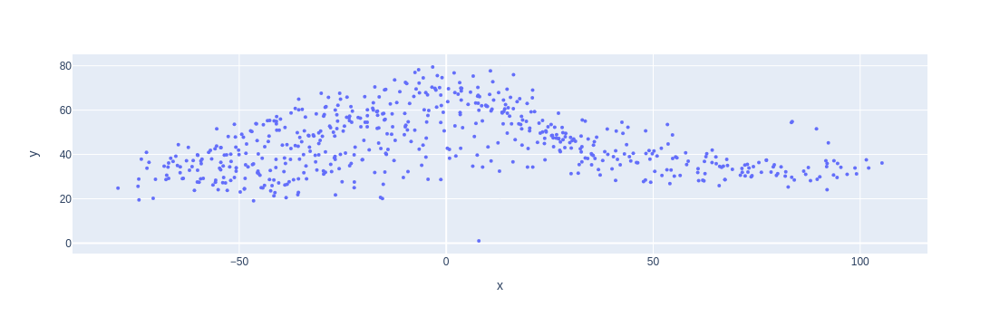

In [144]:
nn_dist_vec = np.mean(nn_dist_array, axis=1)
fig = px.scatter(x=pca_fin1[:, 0], y=nn_dist_vec, opacity=1)
fig.update_traces(marker_size = 4)
fig.show()

In [24]:
k_nn = 3
tree = KDTree(fin_data0)
nearest_dist, nearest_ind = tree.query(fin_data0, k=k_nn + 1)

nn_mean = np.mean(nearest_dist, axis=0)
nn_scale = nn_mean[1]
print(nn_scale)

6.542023760794261


### Experiment with NN-based outlier removal to clean up fin
**To-do:** experiment with alternatives for a couple test cases

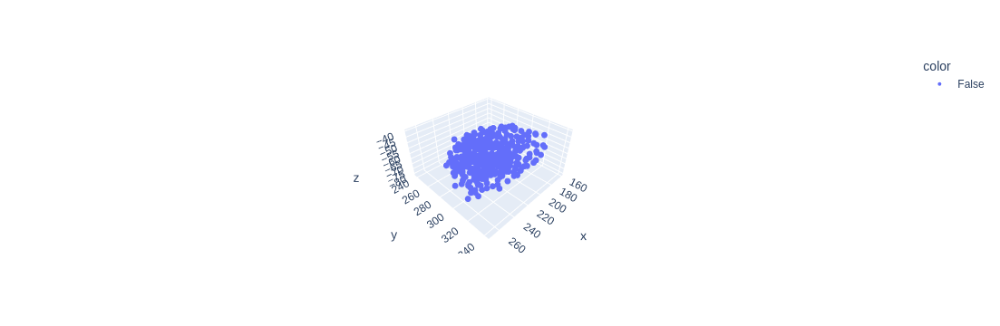

In [26]:
from sklearn.neighbors import KDTree

# data_fin = data_fin[~surf_flags]
k_nn = 3
tree = KDTree(fin_data1)
nearest_dist, nearest_ind = tree.query(fin_data1, k=k_nn + 1)

nn_mean = np.mean(nearest_dist, axis=0)
nn_scale = nn_mean[1]
far_flags = nearest_dist[:, k_nn] > 3*nn_scale

fig = px.scatter_3d(x=fin_data1[:,0], y=fin_data1[:,1], z=-fin_data1[:,2],  color=far_flags,  opacity=1)
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()

fin_data2 = fin_data1[~far_flags]

### Can we fit a surface to the fin?

That didn't quite seem to do the job...why not? Previously, I solve this problem by forcing the surface to pass through a point at the base/center of the fin. One could imagine further requiring it pass through one or multiple points at the tip of the fin. This seems convoluted, though

In [27]:
from sklearn.decomposition import PCA
import open3d as o3d
from sklearn.cluster import KMeans
from scipy.integrate import quad


# fit corresponding plane
# get nn distances
xyz_array = df[["X", "Y", "Z"]].to_numpy()
tree = KDTree(xyz_array)
nearest_dist, nearest_ind = tree.query(xyz_array, k=k_nn + 1)

# find average distance to kth closest neighbor
mean_nn_dist_vec = np.mean(nearest_dist, axis=0)
nn_thresh = mean_nn_dist_vec[k_nn]
nn_thresh_small = mean_nn_dist_vec[1]

print(nn_thresh_small)
print(nn_thresh)

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
6.650629933201075
9.060138831864895


### Find centroid of fin cells near the base (i.e. near yolk surface)

In [35]:
# defie some parameters
n_fin_points = 100
samp_frac = 0.2 

# find pec fin nuclei that are near the surface
dist_array = np.min(distance_matrix(fin_data2, surf_xyz), axis=1)
surf_thresh = np.percentile(dist_array, 5)
surf_indices = np.where(dist_array <= surf_thresh)[0]
xyz_surf = fin_data2[surf_indices]

# calculate centroid
surf_cm = np.mean(xyz_surf, axis=0)
closest_i = np.argmin(np.sqrt(np.sum((surf_cm - surf_xyz)**2, axis=1))) # find closest surface point
closest_point = surf_xyz[closest_i]

# calculate PCA
pca_surf = PCA(n_components=3)

pca_surf.fit(xyz_surf)
vec1 = pca_surf.components_[0] # this should be AP axis of fin, more or less

vec2, _ = calculate_tangent_plane(C_yolk.x, closest_point)
vec2 = vec2 / np.sqrt(np.sum(vec2 ** 2))

if vec2[2] > 0:
    vec2 = -vec2

# generate base pseudopoints to guide curvature of the fin
np.random.seed(1423)
n_base_points = int(samp_frac*n_fin_points)
dist_vec = np.sqrt(np.sum((fin_data2[surf_indices, :] - surf_cm)**2, axis=1))**-1
surf_samples = np.random.choice(surf_indices, n_base_points, replace=True)#, p=dist_vec / np.sum(dist_vec))
base_points = fin_data2[surf_samples] - 2.5 * nn_thresh * vec2

# exclude base points that are too far from our plane prior. If included, these will tend to cause the
# surface fit to perform poorly
plane_normal = np.cross(vec1, vec2)
plane_normal_u = plane_normal / np.sqrt(np.sum(plane_normal ** 2))
D_plane = -np.dot(plane_normal, surf_cm)

d_surf = np.abs(np.sum(np.multiply(plane_normal_u, xyz_surf), axis=1) + D_plane)
ind_rm = surf_indices[np.where(d_surf > nn_thresh)[0]]
keep_indices = [k for k in range(fin_data2.shape[0]) if k not in ind_rm]
xyz_fin_fit = fin_data2[keep_indices].copy()

# generate tip pseudopoints to ensure that curve fits to sparser nuclei in the AER etc
n_tip_points = n_base_points
tree2 = KDTree(xyz_fin_fit)
dist_array, ind_array = tree2.query(surf_cm[np.newaxis, :], k=xyz_fin_fit.shape[0])
far_thresh = np.percentile(dist_array, 95)
tip_options = np.where(dist_array.ravel() > far_thresh)[0]
tip_weights = dist_array.ravel()[tip_options]**2
tip_samples = np.random.choice(tip_options, n_tip_points, replace=True, p=tip_weights/np.sum(tip_weights))
far_id = ind_array[:, tip_samples][0]
tip_points = xyz_fin_fit[far_id]

In [36]:
surf_indices

array([117, 171, 172, 188, 191, 192, 229, 237, 250, 251, 252, 261, 262,
       263, 292, 337, 353, 354])

In [151]:
qc_filter = [0 if i in ind_rm else 1 for i in range(fin_data2.shape[0])]

fig = px.scatter_3d(x=fin_data2[:,0], y=fin_data2[:,1], z=-fin_data2[:,2],  color=qc_filter,  opacity=1)
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()


In [150]:
fig = px.scatter_3d(x=fin_data2[:, 0], y=fin_data2[:, 1], z=fin_data2[:, 2], opacity=0.85)
fig.add_trace(go.Scatter3d(x=fin_data2[surf_indices, 0], y=fin_data2[surf_indices, 1], z=fin_data2[surf_indices, 2], mode="markers"))
fig.update_traces(marker_size = 4)
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

In [149]:
fig = px.scatter_3d(x=xyz_fin_fit[:, 0], y=xyz_fin_fit[:, 1], z=xyz_fin_fit[:, 2], opacity=0.85)
fig.add_trace(go.Scatter3d(x=xyz_fin_fit[far_id, 0], y=xyz_fin_fit[far_id, 1], z=xyz_fin_fit[far_id, 2], mode="markers"))
fig.add_trace(go.Scatter3d(x=base_points[:, 0], y=base_points[:, 1], z=base_points[:, 2], mode="markers"))
fig.update_traces(marker_size = 4)
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

### Fit quadratic surface to fin
**To-do:** need method that is robust for early fin bud stages--currently I use PCA0, which will lead me astray when PD axis is small

In [65]:
#######################
# fit surface to fin points
#######################

# downsample to achieve uniform distribution of fit points
# pcd = o3d.geometry.PointCloud()
# pcd.points = o3d.utility.Vector3dVector(xyz_fin_fit)
# pcd_down = pcd.voxel_down_sample(voxel_size=nn_thresh)
# xyz_fin_down = np.asarray(pcd_down.points)

# Transform to PCA space
PCAFIN = PCA(n_components=3)
PCAFIN.fit(xyz_fin_fit)

# pca_fin_full = PCAFIN.transform(xyz_fin_raw)
pca_fin_fit = PCAFIN.transform(xyz_fin_fit)
pca_fin_base = PCAFIN.transform(base_points)
pca_fin_tip = PCAFIN.transform(tip_points)
# pca_fin_surf = PCAFIN.transform(xyz_surf)

# use kmeans to find key points. Note that we cluster only in PCA0-PCA1 space
n_clusters = n_fin_points
kmeans = KMeans(n_clusters=n_clusters).fit(pca_fin_fit[:, 0:2])
k_labels = kmeans.labels_
pca_fin_array = np.empty((n_clusters, 3))
for n in range(n_clusters):
    k_indices = np.where(k_labels == n)[0]
    pca_fin_array[n, :] = np.mean(pca_fin_fit[k_indices, :], axis=0)

# concatenate into a single array
pca_fin_array = np.concatenate((pca_fin_array, pca_fin_base, pca_fin_tip), axis=0)

# Transform fin base and sphere center points to PCA space
pca_fin_surf_cm = PCAFIN.transform(np.reshape(surf_cm, (1, 3)))
pca_fin_surf_cm = pca_fin_surf_cm.ravel()
# pca_c0 = PCAFIN.transform(np.reshape(c0, (1, 3)))
# pca_c0 = pca_c0.ravel()

# generate reference grid for use during the fit procedure
grid_res = 50
P0, P1 = np.meshgrid(np.linspace(np.min(pca_fin_fit[:, 0]), np.max(pca_fin_fit[:, 0]), grid_res),
                     np.linspace(np.min(pca_fin_fit[:, 1]), np.max(pca_fin_fit[:, 1]), grid_res))

PP0 = P0.flatten()
PP1 = P1.flatten()

xy2 = np.concatenate((PP0[:, np.newaxis], PP1[:, np.newaxis]), axis=1)

def l2_fit_loss_point_euc(C_prop, xyz_fin=pca_fin_array, xy=xy2, cp=pca_fin_surf_cm):
    xyz_pd, C0_full = predict_quadratic_surface(xy, C_prop, cp)
    dist_array = distance_matrix(xyz_fin, xyz_pd)
    residuals = np.min(dist_array, axis=1)
    return residuals

# def l2_fit_loss_point_split(C_prop, xyz_fin=pca_fin_array, xy=xy2, cp=pca_fin_surf_cm):
#     xyz_pd, C0_full = predict_quadratic_surface(xy, C_prop, cp)
#     dist_array = distance_matrix(xyz_fin, xyz_pd)
    
#     residuals = np.min(dist_array, axis=1)**3
#     nn_i = np.argmin(dist_array, axis=1)
#     signs = np.sign(xyz_fin[:, 2] - xyz_pd[nn_i, 2])
#     err = np.sum(np.multiply(residuals,signs))
#     return err + residuals

# NL: this version directly enforces that the surface be normal to the sphere where it intersects the surface
# I found that this lead to poor fit quality, but worth further exploration
# def l2_fit_loss_plane_euc(C_prop, xyz_fin=pca_fin, xy=xy2, cp=pca_fin_surf_cm, sp=pca_c0):
#     xyz_pd, C0_full, _, _ = predict_quadratic_surface2(xy, C_prop, cp, sp)
#     dist_array = distance_matrix(xyz_fin, xyz_pd)
#     residuals = np.min(dist_array, axis=1)
#     return residuals

# initial guess
c0 = [-3, -0.01, -0.015, -0.001, -0.005, -0.01]

# Conduct the fit
c_fit = scipy.optimize.least_squares(l2_fit_loss_point_euc, c0[1:]) 
                                    # bounds=([-np.inf, -np.inf, -np.inf, -np.inf, -np.inf], [0, 0, 0, 0, 0]))
C_fit = c_fit.x
C_out = solve_for_f(C_fit, pca_fin_surf_cm)
P2_curve = np.dot(np.c_[np.ones(PP0.shape), PP0, PP1, PP0 * PP1, PP0 ** 2, PP1 ** 2], C_out).reshape(P0.shape)

xyz_fit_curve = PCAFIN.inverse_transform(np.concatenate((np.reshape(P0, (P0.size, 1)),
                                                         np.reshape(P1, (P1.size, 1)),
                                                         np.reshape(P2_curve, (P2_curve.size, 1))),
                                                        axis=1)
                                         )

In [66]:
# xyz_curve = test[0] 

fig = px.scatter_3d(x=fin_data2[:, 0], y=fin_data2[:, 1], z=-fin_data2[:, 2], opacity=0.85)
fig.update_traces(marker_size = 4)

fig.add_trace(go.Surface(x=np.reshape(xyz_fit_curve[:, 0], (50, 50)), 
                         y=np.reshape(xyz_fit_curve[:, 1], (50, 50)), 
                         z=-np.reshape(xyz_fit_curve[:, 2], (50, 50))))
fig.show()

In [34]:
C_out

[9.5590727872353,
 0.05587721074118239,
 0.10458173629424306,
 -0.0005460216187630927,
 -0.003385562350272497,
 -0.005375792098794716]

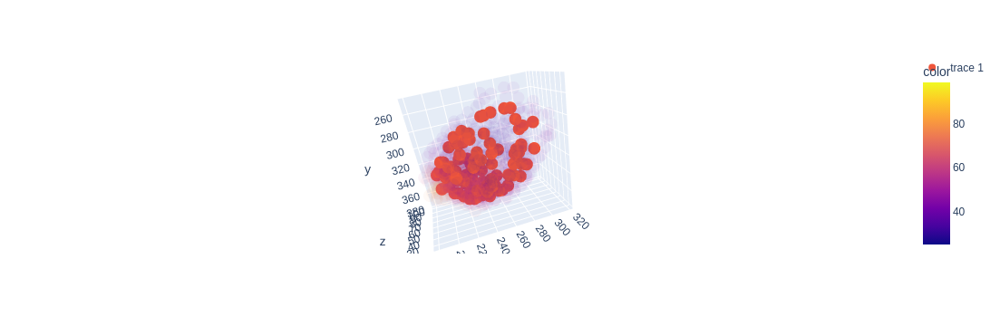

In [209]:
from skimage.measure import block_reduce

data_set = data_fin0#[~far_flags]

n_sample_points = 100
n_neighbors = 25

tree = KDTree(data_set)
nearest_dist, nearest_ind = tree.query(data_set, k=n_neighbors)

options = np.arange(0, data_set.shape[0])
sample_points = np.random.choice(options, n_sample_points, replace=True)
nearest_ind_array = nearest_ind[sample_points, :].ravel()

xyz_long = data_set[nearest_ind_array, :]
# xyz_deep = np.reshape(xyz_long, (n_sample_points, 3, n_neighbors))
points = block_reduce(xyz_long, (n_neighbors, 1), func=np.mean) #np.mean(xyz_deep, axis=2)


fig = px.scatter_3d(x=data_set[:, 0], y=data_set[:, 1], z=data_set[:, 2], color=data_set[:, 2], opacity=0.05)
fig.add_trace(go.Scatter3d(x=points[:,0], y=points[:,1], z=points[:,2], mode="markers"))
fig.show()

In [132]:
import open3d as o3d

(100, 3)

## Try to fit a plynomial surface to the yolk points

In [35]:
def polyfit2d(x, y, z, kx=3, ky=3, order=None):
    '''
    Two dimensional polynomial fitting by least squares.
    Fits the functional form f(x,y) = z.

    Notes
    -----
    Resultant fit can be plotted with:
    np.polynomial.polynomial.polygrid2d(x, y, soln.reshape((kx+1, ky+1)))

    Parameters
    ----------
    x, y: array-like, 1d
        x and y coordinates.
    z: np.ndarray, 2d
        Surface to fit.
    kx, ky: int, default is 3
        Polynomial order in x and y, respectively.
    order: int or None, default is None
        If None, all coefficients up to maxiumum kx, ky, ie. up to and including x^kx*y^ky, are considered.
        If int, coefficients up to a maximum of kx+ky <= order are considered.

    Returns
    -------
    Return paramters from np.linalg.lstsq.

    soln: np.ndarray
        Array of polynomial coefficients.
    residuals: np.ndarray
    rank: int
    s: np.ndarray

    '''

    # grid coords
    # x, y = np.meshgrid(x, y)
    # coefficient array, up to x^kx, y^ky
    coeffs = np.ones((kx+1, ky+1))

    # solve array
    a = np.zeros((coeffs.size, x.size))

    # for each coefficient produce array x^i, y^j
    for index, (j, i) in enumerate(np.ndindex(coeffs.shape)):
        # do not include powers greater than order
        if order is not None and i + j > order:
            arr = np.zeros_like(x)
        else:
            arr = coeffs[i, j] * x**i * y**j
        a[index] = arr.ravel()

    print(a.shape)
    print(z.shape)
    # do leastsq fitting and return leastsq result
    return np.linalg.lstsq(a.T, np.ravel(z), rcond=None)

In [51]:
x = df.loc[df["fin_label_final"]=="2", "X"].to_numpy()
y = df.loc[df["fin_label_final"]=="2", "Y"].to_numpy()
z = df.loc[df["fin_label_final"]=="2", "Z"].to_numpy()

print(x.shape)
order = 5
zs = polyfit2d(x, y, z[:, np.newaxis], kx=order, ky=order, order=None)



(1639,)
(36, 1639)
(1639, 1)


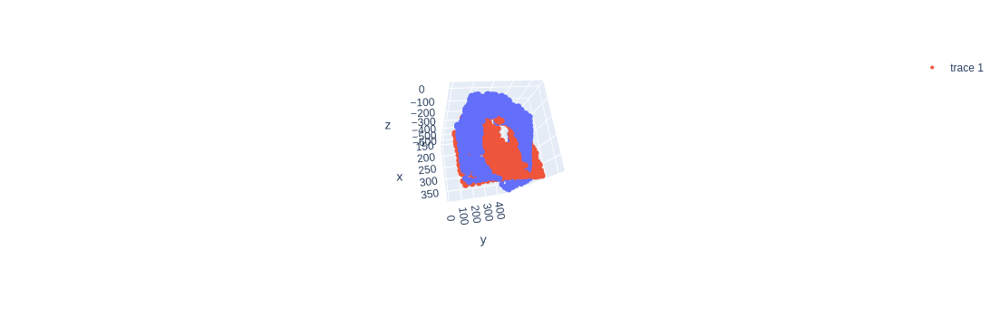

In [52]:
import plotly.graph_objects as go
fitted_surf = np.polynomial.polynomial.polyval2d(x, y, zs[0].reshape((order+1,order+1)))

fig = px.scatter_3d(x=x, y=y, z=fitted_surf, opacity=1)
fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode="markers"))
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=700/350)
           )
fig.update_layout(scene=scene)

fig.show()